In [2]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import copy

# Genetic Algorithm

Basic GA on a dataset (function) from https://en.wikipedia.org/wiki/Test_functions_for_optimization

In [ ]:
# lets randomly pick points in the range of the target function
def initilization_of_population(population_size):
    population = []
    for i in range(population_size): 
        chromosome = ((( np.random.rand(2) - 0.5 ) * 2.0 ) * 5.0 ) # randomly pick our +/- numbers
        population.append(chromosome) 
    return population

# chromosome = np.random.uniform(-5, 5, size=2)

f(x,y)=(x^2+y−11)^2+(x+y^2−7)^2



In [ ]:
# our fitness function
# go over each chromos, evaluate it, then return sorted answer
# 按照我的理解，每个fitness function只是用不同的方式evaluate每一个chromosome（potential solution）的fitness。 根据不同的问题，我们evaluate的方式不同。其他部分则比较相似。
# 例如这里，每个chromosome越接近solution，equation的值越小，score则越大。后续则更容易被选中。
def fitness_score(population):
    scores = []
    for chromosome in population:
        # Himmelblau's function
        score = (chromosome[0]**2 + chromosome[1] - 11)**2 + (chromosome[0] + chromosome[1]**2 - 7)**2 # This is just the x,y of each chromosome....
        scores.append( 1.0 / (score + 0.01) )  #Normally, GA is maximization-based, but Himmelblau’s is a minimization problem.(turn min to max, 0.01 is to avoid divided by 0)
        # Since the equation must be greater than 0 and we want the min of the equation. We choose 1/f(x,y) to be the fitness function. The smaller the f(x,y) the greater the score.

    # Use numpy array to sort the fitness scores in descending order.
    scores, pop = np.array(scores), np.array(population.copy())
    inds = np.argsort(scores) 
    scores = list(scores[inds][::-1])
    pop = list(pop[inds,:][::-1])
    return scores, pop

In [5]:
# roulette wheel selection
def selection(scores,pop_after_fit):
    population_nextgen = []
    # elitism
    population_nextgen.append(pop_after_fit[0].copy())
    population_nextgen.append(pop_after_fit[0].copy())
    # pick our remaining parents (so two for each child)
    max_val = np.sum(scores) # This is like the full size of the roulette wheel.
    for i in range(1,len(scores)):
        for k in range(2):   # We select 2 parent for each child in the next generation.
            pick = random.uniform(0, max_val)
            current = 0
            for j in range(len(scores)): 
                current += scores[j]
                if current > pick: 
                    break 
            population_nextgen.append(pop_after_fit[j].copy()) 
    return population_nextgen

In [ ]:
# simple domain with two dimensions, not much of a crossover ;-)
def crossover(pop_after_sel,population_size):
    # This is the frist child(elite)
    population_nextgen = [] 
    population_nextgen.append(pop_after_sel[0].copy())

    # Iterate through the rest chromosomes.
    # Each parent only has 2 elements. [a,b] a,b are from -5 to 5. 
    for i in range(1,population_size):
        child = pop_after_sel[2*i+0].copy()
        parent2 = pop_after_sel[2*i+1].copy()
        location = np.random.randint(0,2) # Generate a random number 0 or 1 as the location to cross
        child[location] = parent2[location] 
        population_nextgen.append(child) 
    return population_nextgen

In [7]:
# mutation will follow the mutation prob and randomly select a new value
def mutation(pop_after_cross,mutation_rate,sz):
    # We don't apply mutation to the elite
    population_nextgen = []
    population_nextgen.append(pop_after_cross[0].copy())


    for i in range(1,sz): 
        chromosome = pop_after_cross[i].copy()
        for j in range(len(chromosome)): 
            if random.random() < mutation_rate:
                chromosome[j]= ((( np.random.rand() - 0.5 ) * 2.0 ) * 5.0 ) # Creates a new random value in range [-5, 5]. Replace the original value with this new value.
        population_nextgen.append(chromosome.copy())
    return population_nextgen

In [8]:
from tqdm import tqdm_notebook as tqdm

# this is our main function
def generations(sz,mutation_rate,n_gen):
    best_chromo = []
    best_score = []
    population_nextgen = initilization_of_population(sz)
    stats_min = np.zeros(n_gen)
    stats_avg = np.zeros(n_gen)
    stats_max = np.zeros(n_gen)
    # lets store the points from generation to generation
    stored_points = []
    # this is the number of generations
    for i in tqdm(range(n_gen)):
        # evaluate
        scores, pop_after_fit = fitness_score(population_nextgen)
        # select
        pop_sel = selection(scores,pop_after_fit)
        # crossover
        pop_after_cross = crossover(pop_sel,sz)
        # mutation
        population_nextgen = mutation(pop_after_cross,mutation_rate,sz)

        # I do one more scoring as I track values from epoch to epoch (could just change where its at also ;-)
        scores, pop_after_fit = fitness_score(population_nextgen)
        stored_points.append( pop_after_fit ) # remember each epoch
        best_chromo.append(pop_after_fit[0].copy())
        best_score.append(scores[0].copy())        
        stats_min[i] = np.min(scores)
        stats_max[i] = np.amax(scores)
        stats_avg[i] = np.mean(scores)        
    return best_chromo,best_score,stats_min,stats_avg,stats_max,stored_points

C:\Users\Biao Wang\AppData\Local\Temp\ipykernel_36968\3221094539.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm(range(n_gen)):


  0%|          | 0/100 [00:00<?, ?it/s]

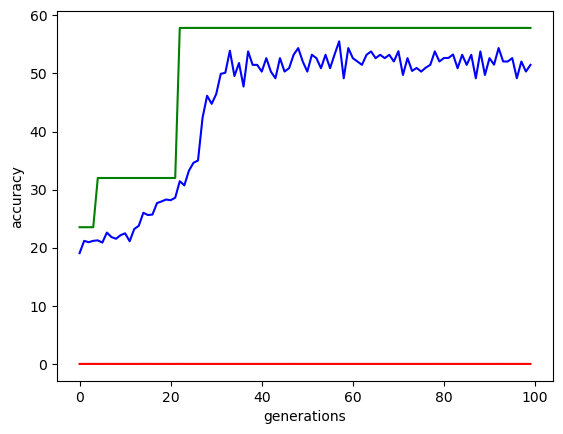

In [9]:
s = 100 # number of individuals
ngen = 100 # number of generations
chromo,score,stats_min,stats_avg,stats_max,stored_points=generations(sz=s,mutation_rate=0.05,n_gen=ngen)

# plot the statistics
plt.plot(stats_min,'r')
plt.plot(stats_avg,'b')
plt.plot(stats_max,'g')
plt.ylabel('accuracy')
plt.xlabel('generations')
plt.show()

Lets also plot this

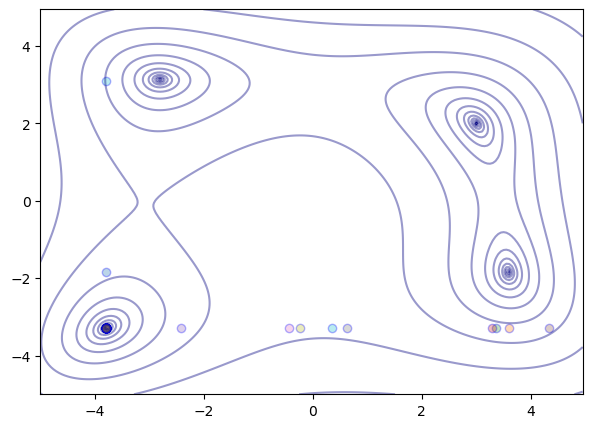

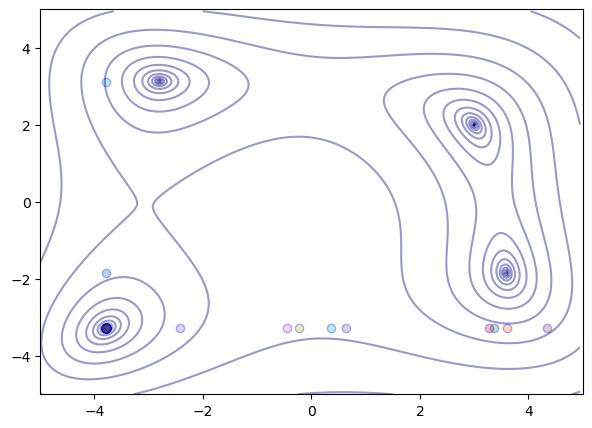

In [10]:
from IPython import display
import pylab as pl
from matplotlib.patches import Ellipse
from sklearn import datasets
import numpy as np
import time
from sklearn import datasets

def my_func(x, y):
    z = (x*x + y - 11)**2 + (x + y*y - 7)**2
    return z

fig, ax = pl.subplots(nrows = 1, ncols = 1, figsize=(7, 5))
for t in range(len(stored_points)):    
    
    pl.clf() 
        
    # get this set of points out
    data = stored_points[t] 
    
    # plot  
    for i in range(len(data)):
        pl.scatter(data[i][0], data[i][1], edgecolor='b', alpha=0.3)  
        
    # Himmelblau
    a = np.arange(-5, 5, 0.05)
    b = np.arange(-5, 5, 0.05)
    x, y = np.meshgrid(a, b)
    z = my_func(x, y)
    pl.contour(x, y, z, levels=np.logspace(-9, 9, 50), cmap='jet', alpha=0.4)    
    
    # animation, so pause it!
    display.clear_output(wait=True)
    display.display(pl.gcf())
    plt.xlim(-5, 5)
    plt.ylim(-5, 5) 
    time.sleep(0.01)     

A version that hopefully does not blink so much for you! :)

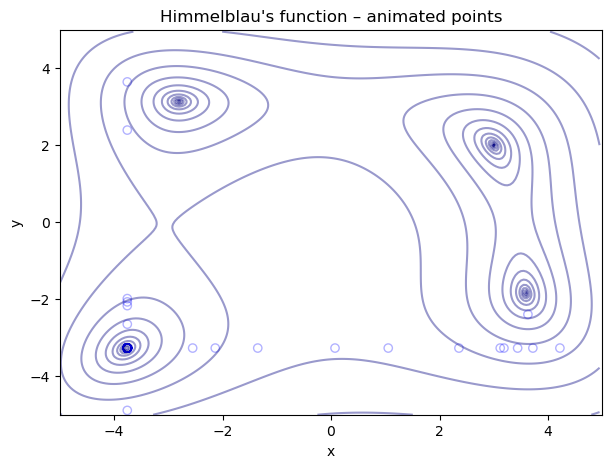

In [11]:
# (optional but recommended in Jupyter)
# %matplotlib widget  # or: from matplotlib import rc; rc('animation', html='jshtml')

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display

def my_func(x, y):
    return (x*x + y - 11)**2 + (x + y*y - 7)**2

def animate_himmelblau(stored_points, interval_ms=30, edgealpha=0.3):
    # 1) Set up figure/axes once
    fig, ax = plt.subplots(figsize=(7, 5))
    ax.set_xlim(-5, 5)
    ax.set_ylim(-5, 5)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title("Himmelblau's function – animated points")

    # 2) Precompute the contour once (expensive)
    a = np.arange(-5, 5, 0.05)
    b = np.arange(-5, 5, 0.05)
    x, y = np.meshgrid(a, b)
    z = my_func(x, y)
    ax.contour(x, y, z, levels=np.logspace(-9, 9, 50), cmap='jet', alpha=0.4)

    # 3) Create an empty scatter artist we'll update per-frame
    scat = ax.scatter([], [], edgecolor='b', facecolors='none', alpha=edgealpha)

    # 4) Update function: only mutate existing artists—no clearing!
    def update(frame_idx):
        data = np.asarray(stored_points[frame_idx])
        # data expected shape: (N, 2)
        if data.size == 0:
            scat.set_offsets(np.empty((0, 2)))
        else:
            scat.set_offsets(data[:, :2])
        return (scat,)

    # 5) Create animation
    anim = FuncAnimation(
        fig,
        update,
        frames=len(stored_points),
        interval=interval_ms,
        blit=False  # blit=True can be faster, but is finicky across Jupyter backends
    )

    # 6) Display smoothly in Jupyter (JS-based HTML animation)
    try:
        from matplotlib import rc
        rc('animation', html='jshtml')
        display(anim)
    except Exception:
        # Fallback to widget backend display if available
        display(anim)

    return anim

# Example usage:
anim = animate_himmelblau(stored_points, interval_ms=30)

# Q&A

Things to consider
 * We used elitism above, was the best score (strictly?) monotonicly increasing? Explain.
 * Experiment with our parameters
 * In the population plot above, what are the trends in the curve and which are good/bad?
 * Why is there a "horizontal/vertical" search pattern? Is that good ...? How would you change that?
 * Can you plug in a different optimization problem?
  * https://en.wikipedia.org/wiki/Test_functions_for_optimization